<a href="https://colab.research.google.com/github/deepika-2411/Mini-Project-BigMart-Sales-Predictive-Analysis/blob/main/Bondora_p2p_lending.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import libraries for loans analysis and wrangling
import pandas as pd
import numpy as np
pd.set_option("display.max_rows", 200)

# import visualization libraries
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


In [ ]:
# Load loansset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Reading input file to pandas loansframe
loans= pd.read_csv('/content/drive/MyDrive/Bondora_raw.zip',low_memory=False)
loans.head().T

,0,1,2,3,4
ReportAsOfEOD,2020-01-27,2020-01-27,2020-01-27,2020-01-27,2020-01-27
LoanId,F0660C80-83F3-4A97-8DA0-9C250112D6EC,978BB85B-1C69-4D51-8447-9C240104A3A2,EA44027E-7FA7-4BB2-846D-9C1F013C8A22,CE67AD25-2951-4BEE-96BD-9C2700C61EF4,9408BF8C-B159-4D6A-9D61-9C2400A986E3
LoanNumber,659,654,641,668,652
ListedOnUTC,2009-06-11 16:40:39,2009-06-10 15:48:57,2009-06-05 19:12:29,2009-06-13 12:01:20,2009-06-10 10:17:13
BiddingStartedOn,2009-06-11 16:40:39,2009-06-10 15:48:57,2009-06-05 19:12:29,2009-06-13 12:01:20,2009-06-10 10:17:13
BidsPortfolioManager,0,0,0,0,0
BidsApi,0,0,0,0,0
BidsManual,115.041,140.6057,319.558,57.5205,319.5582
UserName,KARU,koort681,0ie,Alyona,Kai
NewCreditCustomer,True,False,True,True,True


In [ ]:
loans.shape

(134529, 112)

In [ ]:
loans.describe(include='all',).T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ReportAsOfEOD,134529,1,2020-01-27,134529,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LoanId,134529,134529,F0660C80-83F3-4A97-8DA0-9C250112D6EC,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LoanNumber,134529.0,NaN,NaN,NaN,944939.218711,478673.842616,37.0,620679.0,923597.0,1311025.0,1855339.0
ListedOnUTC,134529,134130,2017-04-20 09:54:00,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BiddingStartedOn,134529,134135,2017-04-20 12:54:00,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BidsPortfolioManager,134529.0,NaN,NaN,NaN,966.452876,1355.686016,0.0,155.0,465.0,1218.0,10625.0
BidsApi,134529.0,NaN,NaN,NaN,29.111664,150.159148,0.0,0.0,0.0,5.0,7570.0
BidsManual,134529.0,NaN,NaN,NaN,559.33259,750.360512,0.0,96.0,317.0,729.0,10630.0
UserName,134529,66654,eiks,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NewCreditCustomer,134529,2,True,77808,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Handling missing values
Firstly let us determine the null values and their percentage among the loans



In [ ]:
total_nulls = loans.isnull().sum()
total_nulls

ReportAsOfEOD                                  0
LoanId                                         0
LoanNumber                                     0
ListedOnUTC                                    0
BiddingStartedOn                               0
BidsPortfolioManager                           0
BidsApi                                        0
BidsManual                                     0
UserName                                       0
NewCreditCustomer                              0
LoanApplicationStartedDate                     0
LoanDate                                       0
ContractEndDate                            75546
FirstPaymentDate                               0
MaturityDate_Original                          0
MaturityDate_Last                              0
ApplicationSignedHour                          0
ApplicationSignedWeekday                       0
VerificationType                              45
LanguageCode                                   0
Age                 

In [ ]:
total_nulls = loans.isnull().sum()
percent_nulls = (loans.isnull().sum()/loans.isnull().count()*100)
null_values  = pd.concat([total_nulls,percent_nulls], axis=1, keys=['total_nulls', 'percent_nulls'])
null_values


,total_nulls,percent_nulls
ReportAsOfEOD,0,0.000000
LoanId,0,0.000000
LoanNumber,0,0.000000
ListedOnUTC,0,0.000000
BiddingStartedOn,0,0.000000
BidsPortfolioManager,0,0.000000
BidsApi,0,0.000000
BidsManual,0,0.000000
UserName,0,0.000000
NewCreditCustomer,0,0.000000


Dropping columns with more than 80% null values as this does not seem to be important features and there is not enough information to analyze



In [ ]:
loans.dropna(axis=1, thresh=int(0.75*len(loans)),inplace=True)
loans.shape

(134529, 70)

Identifying rows with zero variance or only 1 unique value



In [ ]:
loans.nunique().sort_values()


ReportAsOfEOD                                  1
Restructured                                   2
ActiveScheduleFirstPaymentReached              2
NewCreditCustomer                              2
Status                                         3
Gender                                         3
Country                                        4
VerificationType                               5
ModelVersion                                   7
EmploymentStatus                               7
MaritalStatus                                  7
Education                                      7
ApplicationSignedWeekday                       7
Rating                                         8
EmploymentDurationCurrentEmployer              9
CreditScoreEsMicroL                           11
PreviousEarlyRepaymentsCountBeforeLoan        11
HomeOwnershipType                             12
LanguageCode                                  13
UseOfLoan                                     17
OccupationArea      

In [ ]:
loans.drop(['ReportAsOfEOD'], axis=1, inplace=True)


In [ ]:
loans.isna().sum()

LoanId                                        0
LoanNumber                                    0
ListedOnUTC                                   0
BiddingStartedOn                              0
BidsPortfolioManager                          0
BidsApi                                       0
BidsManual                                    0
UserName                                      0
NewCreditCustomer                             0
LoanApplicationStartedDate                    0
LoanDate                                      0
FirstPaymentDate                              0
MaturityDate_Original                         0
MaturityDate_Last                             0
ApplicationSignedHour                         0
ApplicationSignedWeekday                      0
VerificationType                             45
LanguageCode                                  0
Age                                           0
DateOfBirth                                   0
Gender                                  

In [ ]:
null_columns=['ModelVersion','PrincipalOverdueBySchedule','ProbabilityOfDefault','VerificationType','ExpectedReturn','LossGivenDefault','PlannedInterestTillDate','ExpectedLoss','FreeCash','DebtToIncome','HomeOwnershipType','OccupationArea','EmploymentStatus','MaritalStatus','Education','MonthlyPayment','Gender','ApplicationSignedWeekday']

In [ ]:
loans[null_columns]=loans[null_columns].fillna(loans[null_columns].mean())


In [ ]:
loans.isna().sum()

LoanId                                        0
LoanNumber                                    0
ListedOnUTC                                   0
BiddingStartedOn                              0
BidsPortfolioManager                          0
BidsApi                                       0
BidsManual                                    0
UserName                                      0
NewCreditCustomer                             0
LoanApplicationStartedDate                    0
LoanDate                                      0
FirstPaymentDate                              0
MaturityDate_Original                         0
MaturityDate_Last                             0
ApplicationSignedHour                         0
ApplicationSignedWeekday                      0
VerificationType                              0
LanguageCode                                  0
Age                                           0
DateOfBirth                                   0
Gender                                  

In [ ]:
(loans.isnull().mean()*100)[loans.isnull().sum()!=0]


City                                  7.280215
EmploymentDurationCurrentEmployer     0.651161
LastPaymentOn                         7.084718
Rating                                2.029302
CreditScoreEsMicroL                  21.983364
dtype: float64

In [ ]:
loans.select_dtypes('object').columns.to_list()


['LoanId',
 'ListedOnUTC',
 'BiddingStartedOn',
 'UserName',
 'LoanApplicationStartedDate',
 'LoanDate',
 'FirstPaymentDate',
 'MaturityDate_Original',
 'MaturityDate_Last',
 'DateOfBirth',
 'Country',
 'City',
 'EmploymentDurationCurrentEmployer',
 'LastPaymentOn',
 'Rating',
 'Status',
 'CreditScoreEsMicroL']

In [ ]:
loans['City']=loans['City'].fillna(loans['City'].mode()[0])
loans['EmploymentDurationCurrentEmployer']=loans['EmploymentDurationCurrentEmployer'].fillna(loans['EmploymentDurationCurrentEmployer'].mode()[0])
loans['LastPaymentOn']=loans['LastPaymentOn'].fillna(loans['LastPaymentOn'].mode()[0])
loans['Rating']=loans['Rating'].fillna(loans['Rating'].mode()[0])
loans['CreditScoreEsMicroL']=loans['CreditScoreEsMicroL'].fillna(loans['CreditScoreEsMicroL'].mode()[0])


In [ ]:
loans.isna().sum()

LoanId                                    0
LoanNumber                                0
ListedOnUTC                               0
BiddingStartedOn                          0
BidsPortfolioManager                      0
BidsApi                                   0
BidsManual                                0
UserName                                  0
NewCreditCustomer                         0
LoanApplicationStartedDate                0
LoanDate                                  0
FirstPaymentDate                          0
MaturityDate_Original                     0
MaturityDate_Last                         0
ApplicationSignedHour                     0
ApplicationSignedWeekday                  0
VerificationType                          0
LanguageCode                              0
Age                                       0
DateOfBirth                               0
Gender                                    0
Country                                   0
AppliedAmount                   

 county, city have too many categories, LoanDate lacks context


In [ ]:
loans.drop(labels = ['Country', 'City', 'LoanDate'], axis = 1, inplace = True)


# drop redundant variables 


In [ ]:
loans.drop(labels = ['NoOfPreviousLoansBeforeLoan','PreviousEarlyRepaymentsCountBeforeLoan','LanguageCode'],axis = 1, inplace = True)


In [ ]:
drop_cols=['LoanId','LoanNumber','ListedOnUTC','DateOfBirth','BiddingStartedOn','UserName','LoanApplicationStartedDate','IncomeFromPrincipalEmployer', 'IncomeFromPension',
 'IncomeFromFamilyAllowance', 'IncomeFromSocialWelfare',
       'IncomeFromLeavePay', 'IncomeFromChildSupport', 'IncomeOther','LoanApplicationStartedDate','ApplicationSignedHour',
       'ApplicationSignedWeekday','ActiveScheduleFirstPaymentReached','ModelVersion','ProbabilityOfDefault',
          'ExpectedLoss', 'LossGivenDefault', 'ExpectedReturn']
print(len(drop_cols))
loans.drop(drop_cols,axis=1,inplace=True)


23


# drop invalid vars (info we wouldn't know at the time the loan is requested)
# also we already have LoanPeriod, no need for other dates


In [ ]:
loans.drop(labels = ['InterestAndPenaltyPaymentsMade', 'InterestAndPenaltyBalance', 'PrincipalBalance', 'PrincipalPaymentsMade','FirstPaymentDate', 'LastPaymentOn','MaturityDate_Original', 'MaturityDate_Last'], axis = 1, inplace = True)


In [ ]:
loans.fillna(value = {'CreditScoreEsMicroL': 'Other','Rating': 'Other','HomeOwnershipType': 'Not_specified','EmploymentDurationCurrentEmployer': 'Other','EmploymentStatus': 'Not_specified','OccupationArea': 'Not_specified','VerificationType': 'Not_set','Education': 'Not_present','Gender': 'Unknown','MaritalStatus': 'Not_specified'}, axis = 0, inplace = True)
loans.head()


,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,Age,Gender,AppliedAmount,Amount,Interest,...,DebtToIncome,FreeCash,MonthlyPaymentDay,PlannedInterestTillDate,PrincipalOverdueBySchedule,Rating,Status,Restructured,CreditScoreEsMicroL,AmountOfPreviousLoansBeforeLoan
0,0,0,115.0410,True,2.0,61,1.0,319.5582,115.0408,30.0,...,0.0,0.0,25,319.0800,232.959918,E,Repaid,False,M,83.0852
1,0,0,140.6057,False,2.0,48,1.0,191.7349,140.6057,25.0,...,0.0,0.0,15,45.8300,232.959918,E,Repaid,False,M,255.6467
2,0,0,319.5580,True,2.0,58,1.0,319.5582,319.5409,25.0,...,0.0,0.0,25,197.2926,116.350000,E,Late,True,M,0.0000
3,0,0,57.5205,True,2.0,23,1.0,127.8233,57.5205,45.0,...,0.0,0.0,15,293.1000,232.959918,E,Repaid,False,M,134.2144
4,0,0,319.5582,True,2.0,25,1.0,319.5582,319.5436,30.0,...,0.0,0.0,25,833.8100,232.959918,E,Repaid,False,M,146.9966


In [ ]:
cato_var= loans.columns[loans.dtypes == 'object']
for i, c in enumerate(cato_var):
    print(cato_var[i], len(loans[c].unique()))


EmploymentDurationCurrentEmployer 9
Rating 8
Status 3
CreditScoreEsMicroL 11


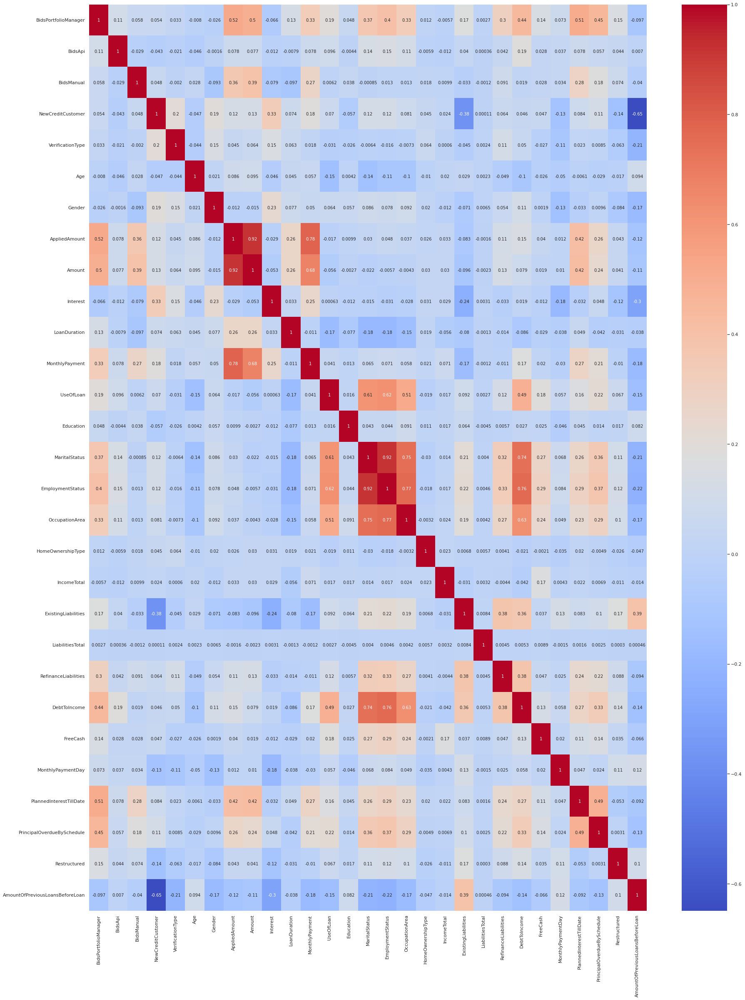

In [ ]:
# %% checking correlation between numerical variables
temp = loans.copy()
numerical = temp.columns[loans.dtypes != 'object']
num_vars = temp[numerical]
plt.figure(figsize = [30, 40])
correlation=num_vars.corr()
sns.heatmap(correlation, cmap = 'coolwarm', annot = True)

#sns.heatmap(num_vars.corr())


In [ ]:
loans = loans.replace(to_replace ="low fat",  value ="Low Fat") 


In [ ]:
loans['Status'] = loans['Status'].map({'Repaid':'Non_Defaulter', 'Late':'Defaulter','Current':'Non_Defaulter'})



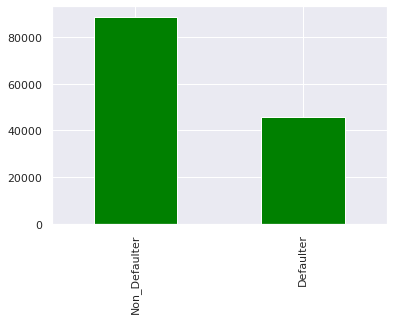

In [ ]:
loans['Status'].value_counts().plot(kind='bar',color = 'Green')


In [ ]:
loans.loc[loans['Education']==1,"Education"]="Primary"
loans.loc[loans['Education']==2,"Education"]="Basic"
loans.loc[loans['Education']==3,"Education"]="Vocational"
loans.loc[loans['Education']==4,"Education"]="Secondary"
loans.loc[loans['Education']==5,"Education"]="Higher"
loans.loc[loans['Education'] == -1.0,"Education"] = 'Not_present'
loans.loc[loans['Education'] == 0.0,"Education"] = 'Not_present'


In [ ]:
loans.loc[loans['EmploymentStatus']==1,"EmploymentStatus"]="Un-Employed"
loans.loc[loans['EmploymentStatus']==2,"EmploymentStatus"]="Partially-Employed"
loans.loc[loans['EmploymentStatus']==3,"EmploymentStatus"]="Fully-Employed"
loans.loc[loans['EmploymentStatus']==4,"EmploymentStatus"]="Self-Employed"
loans.loc[loans['EmploymentStatus']==5,"EmploymentStatus"]="Entrepreneur"
loans.loc[loans['EmploymentStatus']==6,"EmploymentStatus"]="Retiree"
loans.loc[loans['EmploymentStatus']==-1,"EmploymentStatus"]="Unknown"
loans.loc[loans['EmploymentStatus']==0,"EmploymentStatus"]="Unknown"


In [ ]:
loans.loc[loans['Gender'] == 0.0,'Gender'] = 'Male'
loans.loc[loans['Gender'] == 1.0,'Gender']= 'Female'
loans.loc[loans['Gender'] == 2.0,'Gender'] = 'Unknown'


In [ ]:
loans.loc[loans['HomeOwnershipType']==0,"HomeOwnershipType"]="Homeless"
loans.loc[loans['HomeOwnershipType']==1,"HomeOwnershipType"]="Owner"
loans.loc[loans['HomeOwnershipType']==2,"HomeOwnershipType"]='Living_with_parents'
loans.loc[loans['HomeOwnershipType']==3,"HomeOwnershipType"]='Tenant_pre_furnished_property'
loans.loc[loans['HomeOwnershipType']==4,"HomeOwnershipType"]="Tenant_unfurnished_property"
loans.loc[loans['HomeOwnershipType']==5,"HomeOwnershipType"]="Council_house"
loans.loc[loans['HomeOwnershipType']==6,"HomeOwnershipType"]="Joint_tenant"
loans.loc[loans['HomeOwnershipType']==7,"HomeOwnershipType"]="Joint_Ownership"
loans.loc[loans['HomeOwnershipType']==8,"HomeOwnershipType"]="Mortgage"
loans.loc[loans['HomeOwnershipType']==9,"HomeOwnershipType"]='Owner_with_encumbrance'
loans.loc[loans['HomeOwnershipType']==10,"HomeOwnershipType"]="Other"
loans.loc[loans['HomeOwnershipType']==-1,"HomeOwnershipType"]="Unknown"


In [ ]:
loans.loc[loans['MaritalStatus']==-1,"MaritalStatus"]="Not_specified"
loans.loc[loans['MaritalStatus']==0,"MaritalStatus"]="Not_specified"
loans.loc[loans['MaritalStatus']==1,"MaritalStatus"]="Married"
loans.loc[loans['MaritalStatus']==2,"MaritalStatus"]="Cohabitant"
loans.loc[loans['MaritalStatus']==3,"MaritalStatus"]="Single"
loans.loc[loans['MaritalStatus']==4,"MaritalStatus"]="Divorced"
loans.loc[loans['MaritalStatus']==5,"MaritalStatus"]="Widow"


In [ ]:
loans.loc[loans['OccupationArea'] == 1,'OccupationArea'] = 'Other'
loans.loc[loans['OccupationArea'] == 2,'OccupationArea'] = 'Mining'
loans.loc[loans['OccupationArea'] == 3,'OccupationArea'] = 'Processing'
loans.loc[loans['OccupationArea'] == 4,'OccupationArea'] = 'Energy'
loans.loc[loans['OccupationArea'] == 5,'OccupationArea'] = 'Utilities'
loans.loc[loans['OccupationArea'] == 6,'OccupationArea'] = 'Construction'
loans.loc[loans['OccupationArea'] == 7,'OccupationArea'] = 'Retail_and_wholesale'
loans.loc[loans['OccupationArea'] == 8,'OccupationArea'] = 'Transport_and_warehousing'
loans.loc[loans['OccupationArea'] == 9,'OccupationArea'] = 'Hospitality_and_catering'
loans.loc[loans['OccupationArea'] == 10,'OccupationArea'] = 'Info_and_telecom'
loans.loc[loans['OccupationArea'] == 11,'OccupationArea'] = 'Finance_and_insurance'
loans.loc[loans['OccupationArea'] == 12,'OccupationArea'] = 'Real_estate'
loans.loc[loans['OccupationArea'] == 13,'OccupationArea'] = 'Research'
loans.loc[loans['OccupationArea'] == 14,'OccupationArea'] = 'Administrative'
loans.loc[loans['OccupationArea'] == 15,'OccupationArea'] = 'Civil_service_and_military'
loans.loc[loans['OccupationArea'] == 16,'OccupationArea'] = 'Education'
loans.loc[loans['OccupationArea'] == 17,'OccupationArea'] = 'Healthcare_and_social_help'
loans.loc[loans['OccupationArea'] == 18,'OccupationArea'] = 'Art_and_entertainment'
loans.loc[loans['OccupationArea'] == 19,'OccupationArea'] = 'Agriculture_forestry_and_fishing'
loans.loc[loans['OccupationArea'] == -1.0,'OccupationArea'] = 'Not_specified'
loans.loc[loans['OccupationArea'] == 0.0,'OccupationArea'] = 'Not_specified'


In [ ]:
loans.loc[loans['UseOfLoan'] == -1,'UseOfLoan'] = 'Not_set'
loans.loc[loans['UseOfLoan'] == 0,'UseOfLoan'] = 'Loan_consolidation'
loans.loc[loans['UseOfLoan'] == 1,'UseOfLoan'] = 'Real_estate'
loans.loc[loans['UseOfLoan'] == 2,'UseOfLoan'] = 'Home_improvement'
loans.loc[loans['UseOfLoan'] == 3,'UseOfLoan'] = 'Business'
loans.loc[loans['UseOfLoan'] == 4,'UseOfLoan'] = 'Education'
loans.loc[loans['UseOfLoan'] == 5,'UseOfLoan'] = 'Travel'
loans.loc[loans['UseOfLoan'] == 6,'UseOfLoan'] = 'Vehicle'
loans.loc[loans['UseOfLoan'] == 7,'UseOfLoan'] = 'Other'
loans.loc[loans['UseOfLoan'] == 8,'UseOfLoan'] = 'Health'
loans.loc[loans['UseOfLoan'] == 101,'UseOfLoan'] = 'Working_capital_financing'
loans.loc[loans['UseOfLoan'] == 102,'UseOfLoan'] = 'Purchase_of_machinery_equipment'
loans.loc[loans['UseOfLoan'] == 104,'UseOfLoan'] = 'Accounts_receivable_financing'
loans.loc[loans['UseOfLoan'] == 106,'UseOfLoan'] = 'Construction_finance'
loans.loc[loans['UseOfLoan'] == 107,'UseOfLoan'] = 'Acquisition_of_stocks'
loans.loc[loans['UseOfLoan'] == 108,'UseOfLoan'] = 'Acquisition_of_real_estate'
loans.loc[loans['UseOfLoan'] == 110,'UseOfLoan'] = 'Other_business'
loans.loc[loans['VerificationType'] == 0.0,'VerificationType'] = 'Not_set'
loans.loc[loans['VerificationType'] == 1.0,'VerificationType'] = 'Income_unverified'
loans.loc[loans['VerificationType'] == 2.0,'VerificationType'] = 'Income_unverified_crossref_phone'
loans.loc[loans['VerificationType'] == 3.0,'VerificationType'] = 'Income_verified'
loans.loc[loans['VerificationType'] == 4.0,'VerificationType'] = 'Income_expenses_verified'


In [ ]:
loans.loc[loans['NewCreditCustomer'] == False,'NewCreditCustomer'] = 'Existing_credit_customer'
loans.loc[loans['NewCreditCustomer'] == True,'NewCreditCustomer'] = 'New_credit_Customer'

loans.loc[loans['Restructured'] == False,'Restructured']='No'
loans.loc[loans['Restructured'] == True,'Restructured']='Yes'



# EDA

In [ ]:
numerical_cols=[col for col in loans.columns if loans[col].dtype!=object]
categorical_cols=[col for col in loans.columns if loans[col].dtype==object]
print("No of Numerical features =",len(numerical_cols))
print("No of Categorical features =",len(categorical_cols))


No of Numerical features = 19
No of Categorical features = 14


In [ ]:
import plotly.express as px


In [ ]:
def Numerical_Summary():
    for col in numerical_cols:
        print(col)
        print("No of Missing Values =",loans[col].isnull().sum())
        print("Skew =",loans[col].skew())
        print("Histogram")
        fig=px.histogram(loans,x=col)
        fig.show()
        print("="*50)
        
def Categorical_Summary():
    for col in categorical_cols:
        print(col)
        print("No of Missing Values =",loans[col].isnull().sum())
        print(loans[col].value_counts())
        print("="*50)
        


In [ ]:
Numerical_Summary()


BidsPortfolioManager
No of Missing Values = 0
Skew = 2.925870343875909
Histogram


BidsApi
No of Missing Values = 0
Skew = 13.582344459875076
Histogram


BidsManual
No of Missing Values = 0
Skew = 3.2944823109296273
Histogram


Age
No of Missing Values = 0
Skew = 0.33692395556618804
Histogram


AppliedAmount
No of Missing Values = 0
Skew = 1.524536956487582
Histogram


Amount
No of Missing Values = 0
Skew = 1.6057950633237297
Histogram


Interest
No of Missing Values = 0
Skew = 3.4096040071050577
Histogram


LoanDuration
No of Missing Values = 0
Skew = -0.7199364697614673
Histogram


MonthlyPayment
No of Missing Values = 0
Skew = 2.8848312249608203
Histogram


IncomeTotal
No of Missing Values = 0
Skew = 132.15641986949333
Histogram


ExistingLiabilities
No of Missing Values = 0
Skew = 2.006620570395842
Histogram


LiabilitiesTotal
No of Missing Values = 0
Skew = 365.9636779557227
Histogram


RefinanceLiabilities
No of Missing Values = 0
Skew = 7.099648979977824
Histogram


DebtToIncome
No of Missing Values = 0
Skew = 2.1895525914368283
Histogram


FreeCash
No of Missing Values = 0
Skew = 156.68989839883946
Histogram


MonthlyPaymentDay
No of Missing Values = 0
Skew = 0.41460681360982005
Histogram


PlannedInterestTillDate
No of Missing Values = 0
Skew = 3.699265976059689
Histogram


PrincipalOverdueBySchedule
No of Missing Values = 0
Skew = 6.046804441125432
Histogram


AmountOfPreviousLoansBeforeLoan
No of Missing Values = 0
Skew = 2.192350783352676
Histogram


Observations from above plots:-


Bids Columns have alot of zero values with skewed right distributions
Age has some values less then 10 which is not possible.

AppliedAmount,Amount are discrete and not continous and have skew of 1.5 and 1.6 .

Interest has 0 NAN's is highly skewed and alot of values are greather then 100.

Monthly Payments has 6685 NANs and is highly skewed right with some 0 values.

Alot of records has 0 IncomeTotal and high skew.

Debt to Income ratio is expressed as percentage, 2 observations have value greather then 100 which is not possible and has 45 NAN.

PlannedInterestTillDate is right skewed with 3000+ NANs.

Principal Overdueby Schedule is skewed right with NANs
CreditScoreEMini has 1 zero value.

5 rows have Principal Amount less then 0.

Monthly payments,debt to income,free cash,Plnned Interest till date,Principal Overdue by Schedule,Previous Repayments Before Loan, Not Scheduled Payments has missing values.


In [ ]:
pd.crosstab(loans['Status'],loans['UseOfLoan'])


UseOfLoan,Accounts_receivable_financing,Acquisition_of_real_estate,Acquisition_of_stocks,Business,Construction_finance,Education,Health,Home_improvement,Loan_consolidation,Not_set,Other,Other_business,Purchase_of_machinery_equipment,Real_estate,Travel,Vehicle,Working_capital_financing
Status,,,,,,,,,,,,,,,,,
Defaulter,0,0,0,813,0,585,649,4007,2665,30432,4371,0,0,366,741,1143,0
Non_Defaulter,6,1,2,1137,1,781,870,5184,4249,67514,5327,17,21,589,1046,2007,5


Staus and UseofLoan are correlated


In [ ]:
pd.crosstab(loans['Status'],loans['EmploymentStatus'])


EmploymentStatus,0.15371616591727957,Entrepreneur,Fully-Employed,Partially-Employed,Retiree,Self-Employed,Unknown
Status,,,,,,,
Defaulter,21,643,12349,525,1045,740,30449
Non_Defaulter,176,1364,17711,659,755,563,67529


Employment-Status and Status are correlated


In [ ]:
pd.crosstab(loans['Status'],loans['CreditScoreEsMicroL'])


CreditScoreEsMicroL,M,M1,M10,M2,M3,M4,M5,M6,M7,M8,M9
Status,,,,,,,,,,,
Defaulter,37687,2831,42,1017,973,1073,1575,391,50,73,60
Non_Defaulter,84326,1490,13,706,671,467,857,169,19,29,10


CreditScoreEsMicroL abd Status are correlated


In [ ]:
import plotly.graph_objs as go
fig=go.Figure()
fig.add_trace(go.Box(x=loans['Status'],y=loans['ExistingLiabilities']))
